<a href="https://colab.research.google.com/github/yongtaoliu/MicroscopyHackathon/blob/main/Deep_Kernel_Learning_Demo_for_Strucuture_Property_Relationship_in_SPM.ipynb" target="_parent"><img src="https://colab.research.google.com/assets/colab-badge.svg" alt="Open In Colab"/></a>

# **Demo for Deep Kernel Learning Driven Microscopy**



This notebook shows how deep kernel learning (DKL) works in operating microscopy using a pre-acquired piezoresponse spectrscopy (PS) hyperspectra data to simulate microscopy experiment.

The DKL code is implemented using GPax
package https://github.com/ziatdinovmax/gpax.

* This workflow notebook is prepared by [Yongtao Liu](https://scholar.google.com/citations?user=V9FMPgQAAAAJ&hl=en). Update date: Nov 2024
* The piezoresponse spectroscopy data is acquired by [Yongtao Liu](https://scholar.google.com/citations?user=V9FMPgQAAAAJ&hl=en) from a PTO sample synthesized by Hiroshi Funakubo group.

The workflow of DKL-driven microscopy

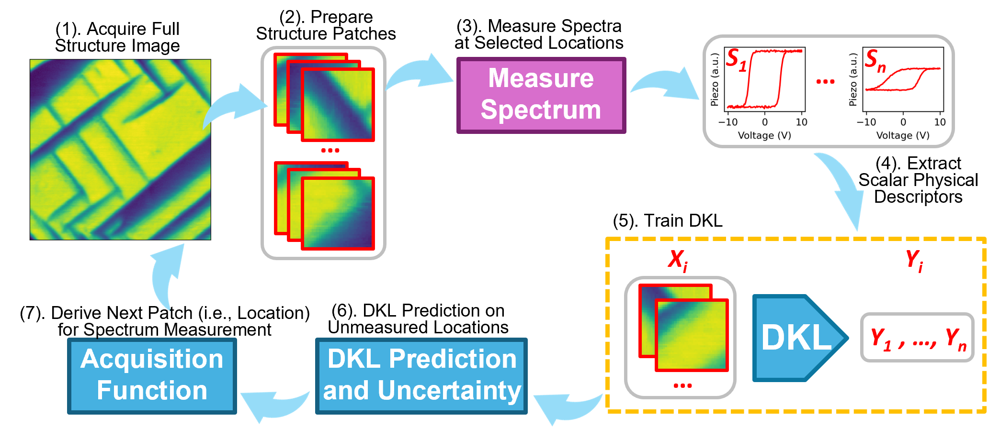

### **Application**
* DKL-driven microscopy for scientific discovery can be seen through its application in [ferroelectric polarization study](https://www.nature.com/articles/s42256-022-00460-0), [non-linear behavior investigation](https://onlinelibrary.wiley.com/doi/full/10.1002/smll.202204130), and [halide perovskites](https://pubs.acs.org/doi/full/10.1021/acs.jpclett.3c00223).

### **Further developments**
* DKL can also be combined with other ML methods such as reinforcement learning to further enhance its capability, see [example](https://www.nature.com/articles/s41524-023-00985-x)
* We also offer an example of integerating human knowledge and interest into DKL-driven autonomous experiment, see [example 1](https://arxiv.org/abs/2408.02071) and [example 2](https://arxiv.org/abs/2409.12295)

## Installation and import

In [ ]:
!pip install -q gpax
!pip install -q atomai
!pip install --upgrade gdown

   ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 103.4/103.4 kB 4.8 MB/s eta 0:00:00
   ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 373.9/373.9 kB 17.0 MB/s eta 0:00:00
   ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 351.1/351.1 kB 26.1 MB/s eta 0:00:00
     ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 193.1/193.1 kB 5.8 MB/s eta 0:00:00
  Preparing metadata (setup.py) ... done
   ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 162.6/162.6 kB 9.6 MB/s eta 0:00:00
   ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 277.8/277.8 kB 20.1 MB/s eta 0:00:00
   ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 176.4/176.4 kB 14.5 MB/s eta 0:00:00
   ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 1.1/1.1 MB 44.9 MB/s eta 0:00:00


In [ ]:
from warnings import filterwarnings

import numpy as np
import matplotlib.pyplot as plt
import math
import os

from sklearn.model_selection import train_test_split

import gpax
from atomai.utils import get_coord_grid, extract_patches_and_spectra, extract_subimages

gpax.utils.enable_x64()
filterwarnings("ignore", module="haiku._src.data_structures")

## Load a pre-acquired PS data to simulate a microscopy experiment

Download PS data:

In [ ]:
!wget https://github.com/yongtaoliu/MicroscopyHackathon/raw/main/PTO_BEPS_1um.npz

--2024-11-13 16:10:58--  https://github.com/yongtaoliu/MicroscopyHackathon/raw/main/PTO_BEPS_1um.npz
Resolving github.com (github.com)... 140.82.112.4
Connecting to github.com (github.com)|140.82.112.4|:443... connected.
HTTP request sent, awaiting response... 302 Found
Location: https://raw.githubusercontent.com/yongtaoliu/MicroscopyHackathon/main/PTO_BEPS_1um.npz [following]
--2024-11-13 16:10:59--  https://raw.githubusercontent.com/yongtaoliu/MicroscopyHackathon/main/PTO_BEPS_1um.npz
Resolving raw.githubusercontent.com (raw.githubusercontent.com)... 185.199.108.133, 185.199.109.133, 185.199.110.133, ...
Connecting to raw.githubusercontent.com (raw.githubusercontent.com)|185.199.108.133|:443... connected.
HTTP request sent, awaiting response... 200 OK
Length: 5142816 (4.9M) [application/octet-stream]
Saving to: ‘PTO_BEPS_1um.npz’

PTO_BEPS_1um.npz    100%[===================>]   4.90M  --.-KB/s    in 0.06s   

2024-11-13 16:10:59 (86.8 MB/s) - ‘PTO_BEPS_1um.npz’ saved [5142816/514281

Load the data:

In [ ]:
input_file = np.load("/content/PTO_BEPS_1um.npz")
input_file.files

['image', 'spectra', 'spec_step_vol']

In [ ]:
image = input_file['image']
print(image.shape)
spectra = input_file['spectra']
print(spectra.shape)
v_step = input_file['spec_step_vol']

(50, 50)
(50, 50, 256)


Plot the data

Text(0, 0.5, 'Piezoresponse (a.u.)')

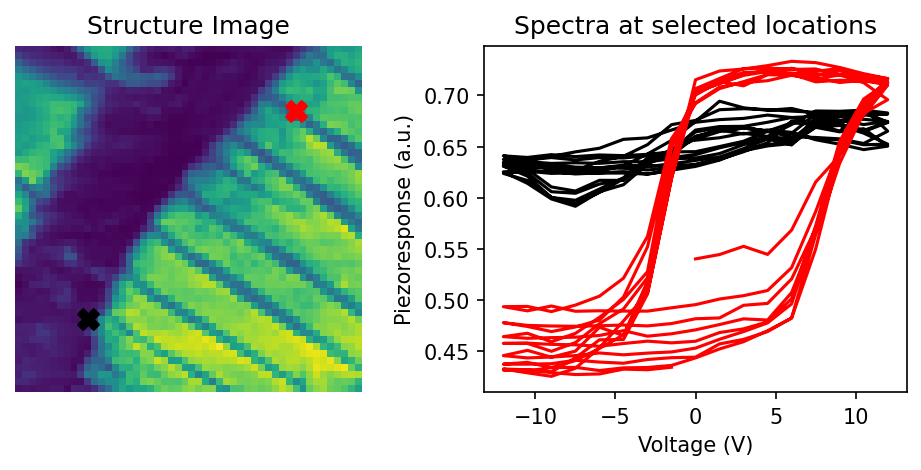

In [ ]:
spec_pixel_x1 = 10; spec_pixel_y1 = 10
spec_pixel_x2 = 40; spec_pixel_y2 = 40
# Plot image and spectra at selected locations
f, (ax1, ax2) = plt.subplots(1, 2, figsize=(8, 3), dpi = 150)

ax1.imshow(image, origin = "lower")
ax1.scatter(spec_pixel_x1, spec_pixel_y1, marker='X', s=100, c='k')
ax1.scatter(spec_pixel_x2, spec_pixel_y2, marker='X', s=100, c='r')
ax1.set_title('Structure Image')
ax1.axis("off")

ax2.set_title("Spectra at selected locations")
ax2.plot(v_step, spectra[spec_pixel_x1, spec_pixel_y1], c = 'k')
ax2.plot(v_step, spectra[spec_pixel_x2, spec_pixel_y2], c = 'r')
ax2.set_xlabel('Voltage (V)')
ax2.set_ylabel('Piezoresponse (a.u.)')

⚡ ⚡ ⚡ ⚡ ⚡ ⚡ ⚡

***Note: This dataset includes an image showing nanoscale structures and spectra for all locations. However, in a real microscopy experiment, spectra are only available at the measured locations. Therefore, in the simulated experiment, DKL will only have access to the image and the spectra at the selected (i.e., measured) locations.***

## Deep Kernel Learning

✅ It will be easier to understand DKL-experiment by following the workflows of DKL-driven microscopy at the beginning of this notebook

Data preprocessing for DKL

In [ ]:
# Prepare image patches that show local structures
coordinates = get_coord_grid(image, step = 1, return_dict=False)

# extract image patch for each point on a grid
window_size = 16
features_all, coords, _ = extract_subimages(image, coordinates, window_size)
features = features_all[:,:,:,0]

indices_all = np.array(coords, dtype = int)

print(features.shape)

(1225, 16, 16)


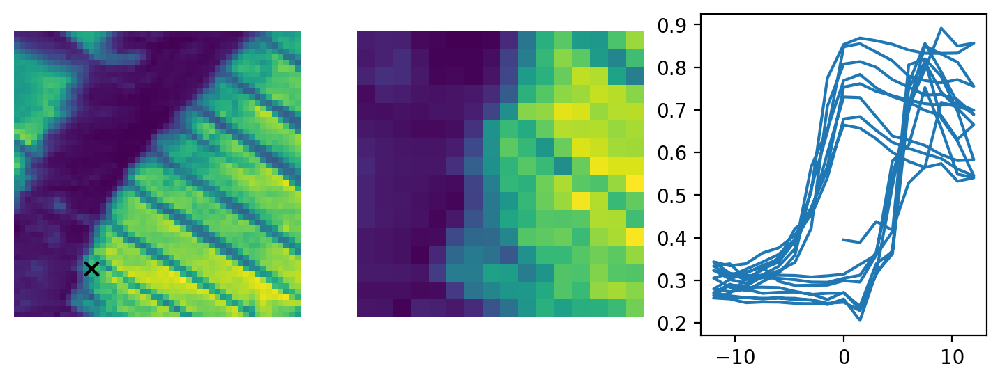

In [ ]:
#Plot an example patch and spectrum
k = 5

f, (ax1, ax2, ax3) = plt.subplots(1, 3, figsize=(9, 3), dpi =200)
ax1.imshow(image, origin = 'lower')
ax1.scatter(indices_all[k, 1], indices_all[k, 0], marker='x', s=50, c='k')

ax1.axis("off")
ax2.imshow(features[k], origin = 'lower')
ax2.axis("off")
ax3.plot(v_step, spectra[indices_all[k, 0], indices_all[k, 1]])

Normalize data:

In [ ]:
norm_ = lambda x: (x - x.min()) / x.ptp()
features = norm_(features)

### DKL-driven microscopy experiment
Now we are going to use DKL to actively learn the relationship between local structures and their corresponding physical behavior or property, Trained DKL can make prediction for the physical property over the entire image (including unmeasured locations). We can use the prediction and uncertainty to compute acquisition function for sampling the next measurement point.

Next, we define a scalarizer function that will convert a measured spectrum into a scalar physical descriptor.

In this PS dataset, we use a scalar function that calculates the hysteresis loop area. In SNVM experiment, we need to define a different scalar function that extracts physical descriptor from SNVM spectroscopy data.

In [ ]:
# here the scalar function is to calculate the hysteresis loop area
def loop_area (raw_spec, cycle) :
  raw_spec_len = len(raw_spec)
  cycle_len = int(raw_spec_len / cycle)
  half_len = int(cycle_len / 2)
  q_len = int(cycle_len / 4)
  loop_top, loop_bottom = [], []
  loop_top.append(raw_spec[q_len : q_len + half_len])
  loop_top.append(raw_spec[q_len + 2*half_len : q_len + 3*half_len])
  loop_top.append(raw_spec[q_len + 4*half_len : 2*q_len + 4*half_len])
  loop_bottom.append(raw_spec[:q_len])
  loop_bottom.append(raw_spec[q_len + half_len: q_len + 2*half_len])
  loop_bottom.append(raw_spec[q_len + 3*half_len: q_len + 4*half_len])
  loop_top = np.concatenate(loop_top)
  loop_bottom = np.concatenate(loop_bottom)
  return np.abs(np.sum(loop_top)-np.sum(loop_bottom))

Also define a function to plot DKL sampling results (this is optional)

In [ ]:
def plot_result(indices, obj):
    plt.figure(figsize = (4, 4))
    plt.scatter(indices[:, 1], indices[:, 0], s=10, c=obj)
    next_point = indices[obj.argmax()]
    plt.scatter(next_point[1], next_point[0], s=10, marker='x', c='k')
    plt.xticks([])
    plt.yticks([])
    plt.title("Acquisition Values")
    plt.show()

Set some parameters, convert data... for DKL

In [ ]:
n, d1, d2 = features.shape
struc_imgs = features.reshape(n, d1*d2)
data_dim = struc_imgs.shape[-1]

struc_imgs.shape

(1225, 256)

At the beginning, we need to 'do' spectroscopy measurements at some locations (either random or defined by operator) to start training DKL. Here let us just 'do' spectroscopy at some random locations.

In [ ]:
#  initial measurement points
init_size = 3   # number of spectroscopy measurements at the beginning

# select the random locations and corresponding structure image, indices, etc.
(measured_struc, unmeasured_struc, indices_measured, indices_unmeasured) = train_test_split(
      struc_imgs, indices_all, test_size=1-init_size/len(struc_imgs), shuffle=True, random_state=10)

len(measured_struc)

3

Now we are going to 'do' spectroscopy measurements at selected locations

In [ ]:
#############*********************************************************************************###############
#############******************************************Start**********************************###############
#############***In real experiments, this part will be replaced by spepctroscopy acquistion***###############
#############*********************************************************************************###############
measured_spec = []
measured_spec_scalar = []
for i in range (len(measured_struc)):
  measuring_spec = spectra[indices_measured[i, 1], indices_measured[i, 0]]   # "Do" spectroscopy measurement at selected location
  measuring_spec_scalar = loop_area(measuring_spec, 8)               # Convert spectrum to scalar physical descriptor
  measured_spec.append(measuring_spec)
  measured_spec_scalar.append(measuring_spec_scalar)                 # Append newly measured data

measured_spec = np.array(measured_spec)
measured_spec_scalar = np.array(measured_spec_scalar)
#############***************************************************************************###############
#############***************************************************************************###############

(-0.5, 49.5, -0.5, 49.5)

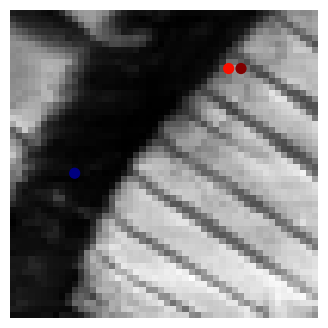

In [ ]:
# we can plot the measured locations and corresponding scalar descriptor
plt.figure(figsize=(4, 4))
plt.imshow(image, origin = "lower", cmap = "gray")
plt.scatter(indices_measured[:, 1], indices_measured[:, 0], s = 50, c=measured_spec_scalar, cmap = "jet")
plt.axis("off")

Now we are going to do DKL-driven exploration

1/50


100%|██████████| 200/200 [00:01<00:00, 134.56it/s, init loss: 20122.2644, avg. loss [191-200]: 19061.9626]



Inferred GP kernel parameters
k_length         [0.404  0.3708]
k_scale          0.34740000000000004
noise            0.36810000000000004


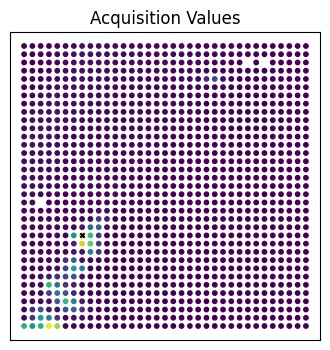

2/50


100%|██████████| 200/200 [00:01<00:00, 142.60it/s, init loss: 20123.6436, avg. loss [191-200]: 19062.5319]



Inferred GP kernel parameters
k_length         [0.4034 0.3705]
k_scale          0.35960000000000003
noise            0.3211


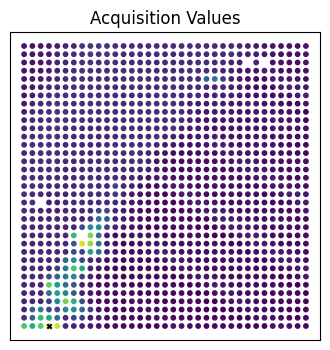

3/50


100%|██████████| 200/200 [00:01<00:00, 139.10it/s, init loss: 20124.8924, avg. loss [191-200]: 19063.3003]



Inferred GP kernel parameters
k_length         [0.4032 0.3697]
k_scale          0.3286
noise            0.3214


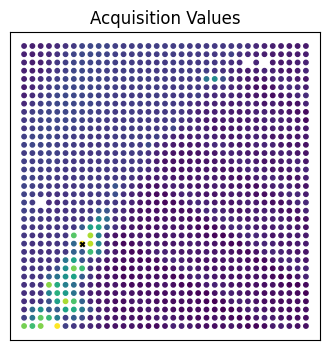

4/50


100%|██████████| 200/200 [00:01<00:00, 141.91it/s, init loss: 20126.1415, avg. loss [191-200]: 19063.3896]



Inferred GP kernel parameters
k_length         [0.4021 0.3006]
k_scale          0.35900000000000004
noise            0.2411


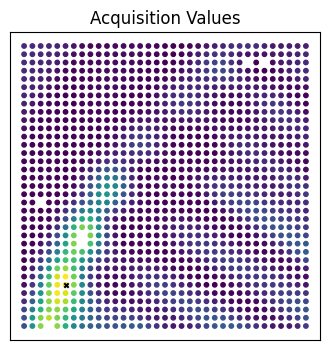

5/50


100%|██████████| 200/200 [00:01<00:00, 140.43it/s, init loss: 20127.4005, avg. loss [191-200]: 19064.1309]



Inferred GP kernel parameters
k_length         [0.4014 0.3698]
k_scale          0.3155
noise            0.2808


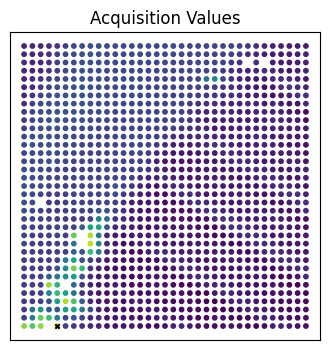

6/50


100%|██████████| 200/200 [00:01<00:00, 138.55it/s, init loss: 20128.6332, avg. loss [191-200]: 19063.9848]



Inferred GP kernel parameters
k_length         [0.4011 0.2969]
k_scale          0.3618
noise            0.2207


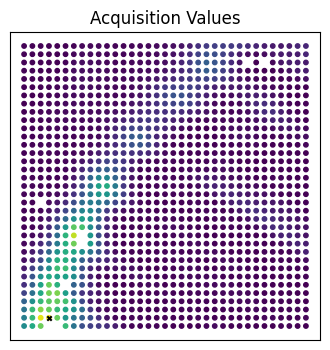

7/50


100%|██████████| 200/200 [00:01<00:00, 136.44it/s, init loss: 20129.8432, avg. loss [191-200]: 19064.4117]



Inferred GP kernel parameters
k_length         [0.3999 0.3023]
k_scale          0.35960000000000003
noise            0.2129


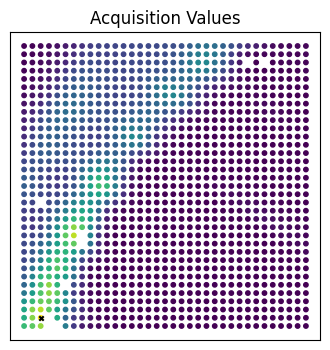

8/50


100%|██████████| 200/200 [00:01<00:00, 135.75it/s, init loss: 20131.0106, avg. loss [191-200]: 19064.4462]



Inferred GP kernel parameters
k_length         [0.3987 0.2969]
k_scale          0.3598
noise            0.2061


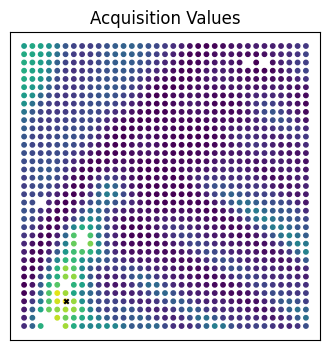

9/50


100%|██████████| 200/200 [00:01<00:00, 136.30it/s, init loss: 20132.1845, avg. loss [191-200]: 19064.4631]



Inferred GP kernel parameters
k_length         [0.3993 0.2976]
k_scale          0.3557
noise            0.2016


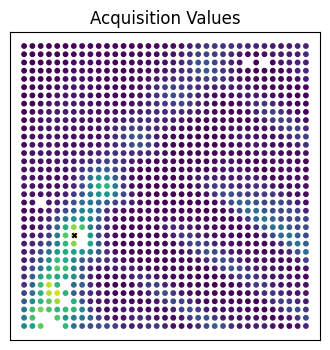

10/50


100%|██████████| 200/200 [00:01<00:00, 136.53it/s, init loss: 20133.3952, avg. loss [191-200]: 19064.6367]



Inferred GP kernel parameters
k_length         [0.3963 0.2947]
k_scale          0.3587
noise            0.1971


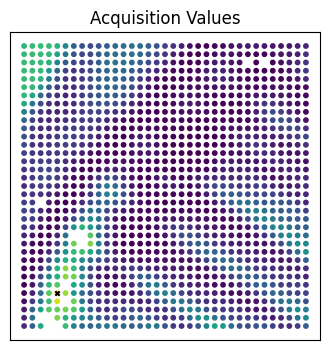

11/50


100%|██████████| 200/200 [00:01<00:00, 134.62it/s, init loss: 20134.6036, avg. loss [191-200]: 19064.8313]



Inferred GP kernel parameters
k_length         [0.397  0.2953]
k_scale          0.35960000000000003
noise            0.1958


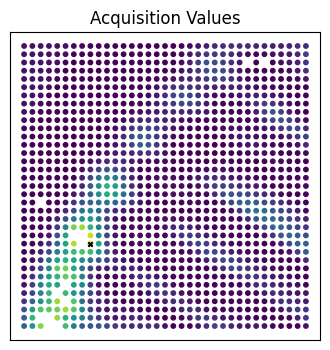

12/50


100%|██████████| 200/200 [00:01<00:00, 133.14it/s, init loss: 20135.8441, avg. loss [191-200]: 19064.8428]



Inferred GP kernel parameters
k_length         [0.3958 0.2908]
k_scale          0.36010000000000003
noise            0.1915


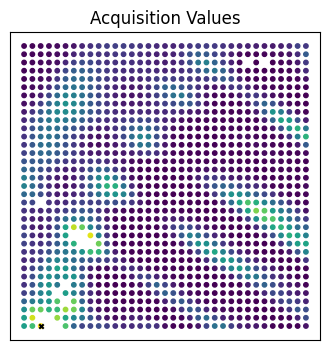

13/50


100%|██████████| 200/200 [00:01<00:00, 132.50it/s, init loss: 20136.9823, avg. loss [191-200]: 19065.0818]



Inferred GP kernel parameters
k_length         [0.3966 0.2889]
k_scale          0.3623
noise            0.18910000000000002


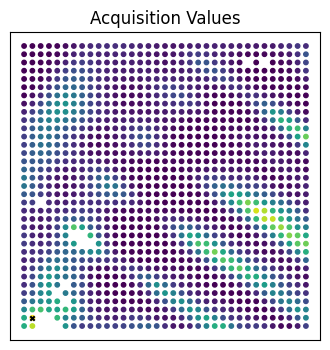

14/50


100%|██████████| 200/200 [00:01<00:00, 132.51it/s, init loss: 20138.1693, avg. loss [191-200]: 19065.2230]



Inferred GP kernel parameters
k_length         [0.3945 0.2856]
k_scale          0.3624
noise            0.1882


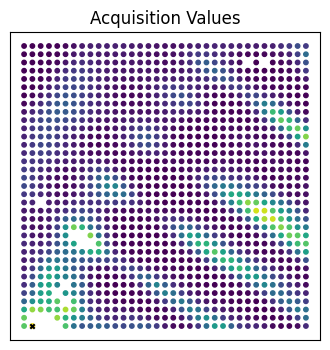

15/50


100%|██████████| 200/200 [00:01<00:00, 128.51it/s, init loss: 20139.3249, avg. loss [191-200]: 19065.3608]



Inferred GP kernel parameters
k_length         [0.3956 0.2871]
k_scale          0.36000000000000004
noise            0.1869


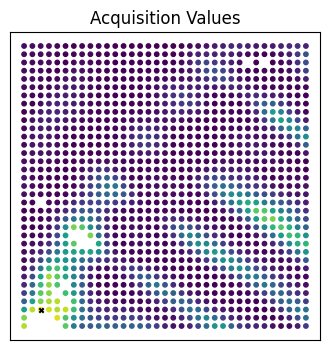

16/50


100%|██████████| 200/200 [00:01<00:00, 127.03it/s, init loss: 20140.5034, avg. loss [191-200]: 19065.2981]



Inferred GP kernel parameters
k_length         [0.3905 0.2839]
k_scale          0.3674
noise            0.1841


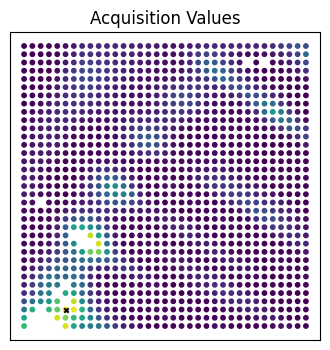

17/50


100%|██████████| 200/200 [00:01<00:00, 128.03it/s, init loss: 20141.6612, avg. loss [191-200]: 19065.5786]



Inferred GP kernel parameters
k_length         [0.3909 0.2872]
k_scale          0.36200000000000004
noise            0.1839


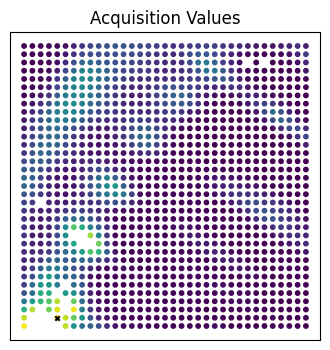

18/50


100%|██████████| 200/200 [00:01<00:00, 125.42it/s, init loss: 20142.8355, avg. loss [191-200]: 19065.7912]



Inferred GP kernel parameters
k_length         [0.3193 0.3585]
k_scale          0.3658
noise            0.18280000000000002


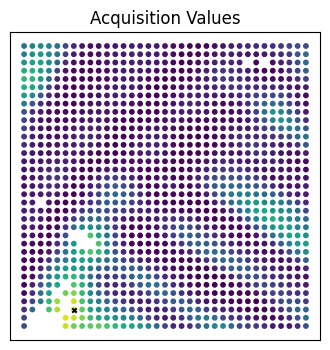

19/50


100%|██████████| 200/200 [00:01<00:00, 125.83it/s, init loss: 20144.0544, avg. loss [191-200]: 19066.3084]



Inferred GP kernel parameters
k_length         [0.3876 0.2924]
k_scale          0.3599
noise            0.18280000000000002


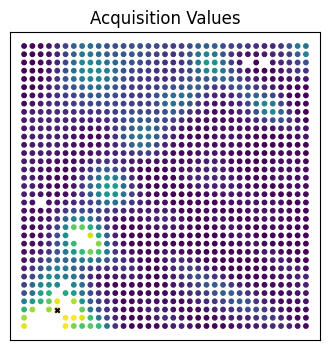

20/50


100%|██████████| 200/200 [00:01<00:00, 125.06it/s, init loss: 20145.1699, avg. loss [191-200]: 19065.7898]



Inferred GP kernel parameters
k_length         [0.3886 0.2928]
k_scale          0.3582
noise            0.18100000000000002


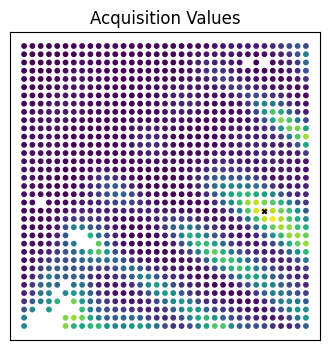

21/50


100%|██████████| 200/200 [00:01<00:00, 127.75it/s, init loss: 20146.4150, avg. loss [191-200]: 19066.1290]



Inferred GP kernel parameters
k_length         [0.3892 0.3001]
k_scale          0.3524
noise            0.17980000000000002


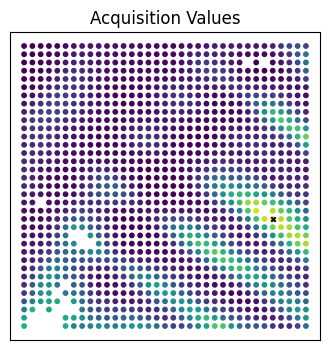

22/50


100%|██████████| 200/200 [00:01<00:00, 124.39it/s, init loss: 20147.6233, avg. loss [191-200]: 19066.3802]



Inferred GP kernel parameters
k_length         [0.3857 0.2928]
k_scale          0.35660000000000003
noise            0.1789


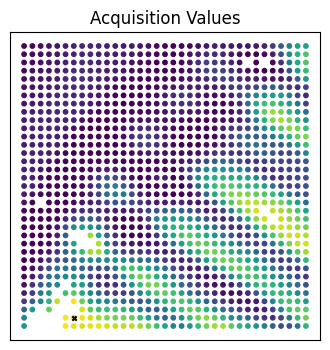

23/50


100%|██████████| 200/200 [00:01<00:00, 126.44it/s, init loss: 20148.7525, avg. loss [191-200]: 19066.3203]



Inferred GP kernel parameters
k_length         [0.3876 0.3027]
k_scale          0.35550000000000004
noise            0.1781


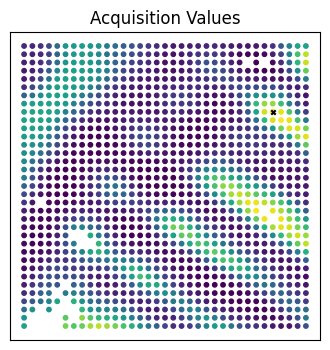

24/50


100%|██████████| 200/200 [00:01<00:00, 124.24it/s, init loss: 20149.7523, avg. loss [191-200]: 19066.4788]



Inferred GP kernel parameters
k_length         [0.3851 0.2959]
k_scale          0.32680000000000003
noise            0.1791


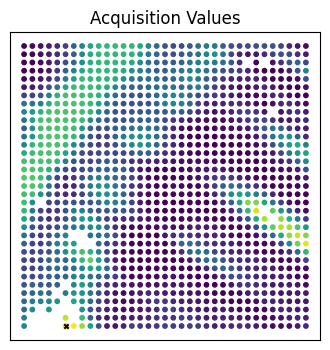

25/50


100%|██████████| 200/200 [00:01<00:00, 121.20it/s, init loss: 20150.9070, avg. loss [191-200]: 19066.2521]



Inferred GP kernel parameters
k_length         [0.3841 0.293 ]
k_scale          0.3297
noise            0.1778


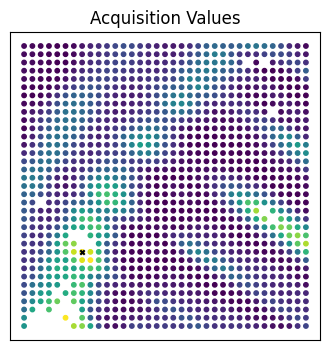

26/50


100%|██████████| 200/200 [00:01<00:00, 121.09it/s, init loss: 20152.0322, avg. loss [191-200]: 19066.5006]



Inferred GP kernel parameters
k_length         [0.3811 0.3013]
k_scale          0.32930000000000004
noise            0.17750000000000002


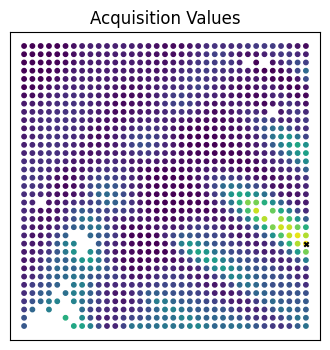

27/50


100%|██████████| 200/200 [00:01<00:00, 118.27it/s, init loss: 20153.2753, avg. loss [191-200]: 19066.7633]



Inferred GP kernel parameters
k_length         [0.3766 0.3073]
k_scale          0.3235
noise            0.1779


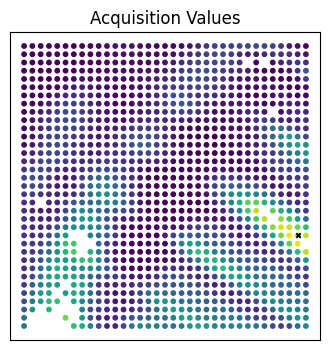

28/50


100%|██████████| 200/200 [00:01<00:00, 114.13it/s, init loss: 20154.4744, avg. loss [191-200]: 19067.1272]



Inferred GP kernel parameters
k_length         [0.3801 0.3057]
k_scale          0.3244
noise            0.17830000000000001


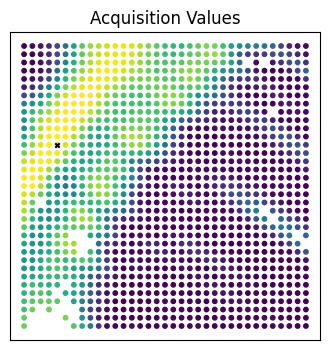

29/50


100%|██████████| 200/200 [00:01<00:00, 118.17it/s, init loss: 20155.7103, avg. loss [191-200]: 19066.9809]



Inferred GP kernel parameters
k_length         [0.3636 0.3234]
k_scale          0.3229
noise            0.1772


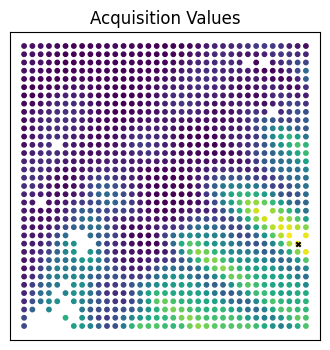

30/50


100%|██████████| 200/200 [00:01<00:00, 121.25it/s, init loss: 20156.9488, avg. loss [191-200]: 19067.0929]



Inferred GP kernel parameters
k_length         [0.3788 0.313 ]
k_scale          0.32270000000000004
noise            0.1762


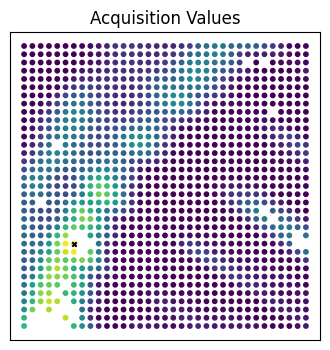

31/50


100%|██████████| 200/200 [00:01<00:00, 117.04it/s, init loss: 20158.0924, avg. loss [191-200]: 19066.9397]



Inferred GP kernel parameters
k_length         [0.3765 0.311 ]
k_scale          0.32320000000000004
noise            0.1759


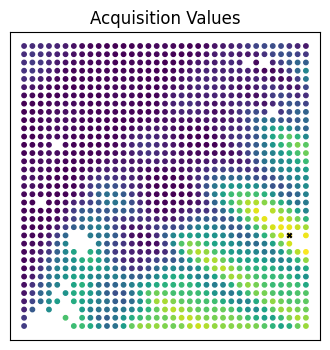

32/50


100%|██████████| 200/200 [00:01<00:00, 116.82it/s, init loss: 20159.2550, avg. loss [191-200]: 19067.3755]



Inferred GP kernel parameters
k_length         [0.3756 0.3169]
k_scale          0.32180000000000003
noise            0.1762


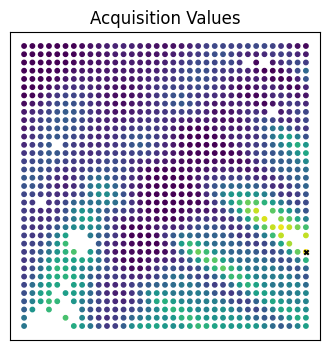

33/50


100%|██████████| 200/200 [00:01<00:00, 118.27it/s, init loss: 20160.4903, avg. loss [191-200]: 19067.7769]



Inferred GP kernel parameters
k_length         [0.375  0.3325]
k_scale          0.317
noise            0.1766


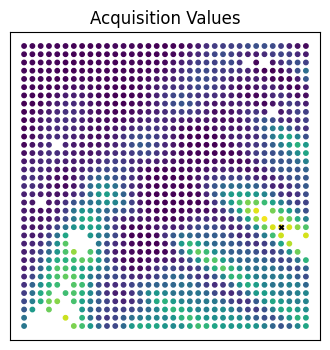

34/50


100%|██████████| 200/200 [00:01<00:00, 116.78it/s, init loss: 20161.6196, avg. loss [191-200]: 19067.8073]



Inferred GP kernel parameters
k_length         [0.3749 0.3228]
k_scale          0.319
noise            0.1761


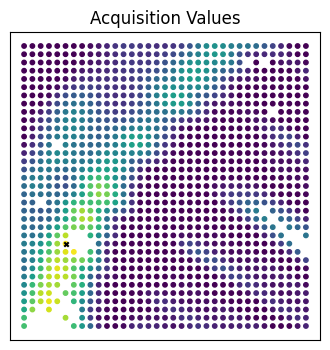

35/50


100%|██████████| 200/200 [00:01<00:00, 115.79it/s, init loss: 20162.8380, avg. loss [191-200]: 19067.6473]



Inferred GP kernel parameters
k_length         [0.373  0.3189]
k_scale          0.32180000000000003
noise            0.1756


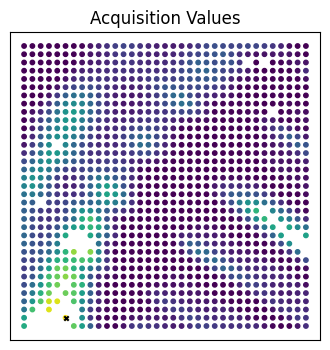

36/50


100%|██████████| 200/200 [00:01<00:00, 116.40it/s, init loss: 20164.0243, avg. loss [191-200]: 19067.5970]



Inferred GP kernel parameters
k_length         [0.3753 0.3138]
k_scale          0.3236
noise            0.1754


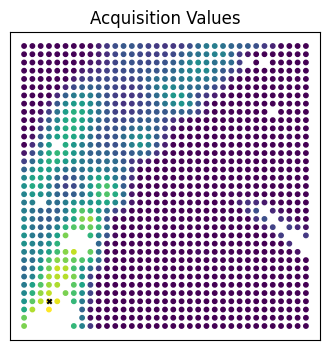

37/50


100%|██████████| 200/200 [00:01<00:00, 114.22it/s, init loss: 20165.1673, avg. loss [191-200]: 19067.6869]



Inferred GP kernel parameters
k_length         [0.3765 0.3106]
k_scale          0.3269
noise            0.17450000000000002


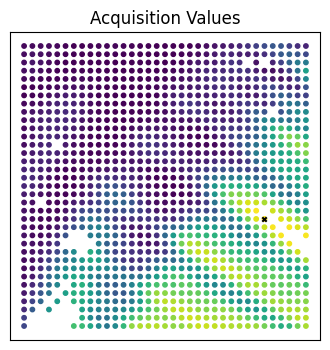

38/50


100%|██████████| 200/200 [00:01<00:00, 115.97it/s, init loss: 20166.3782, avg. loss [191-200]: 19068.5598]



Inferred GP kernel parameters
k_length         [0.3674 0.3285]
k_scale          0.32130000000000003
noise            0.1757


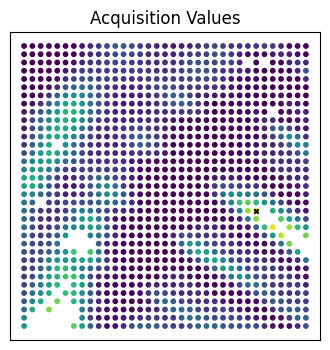

39/50


100%|██████████| 200/200 [00:01<00:00, 116.58it/s, init loss: 20167.5571, avg. loss [191-200]: 19068.2907]



Inferred GP kernel parameters
k_length         [0.3767 0.3305]
k_scale          0.3205
noise            0.17500000000000002


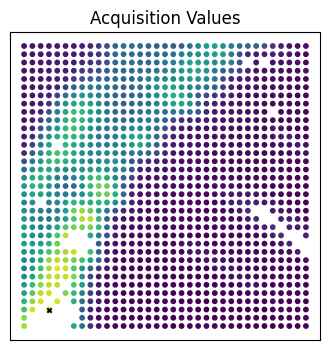

40/50


100%|██████████| 200/200 [00:01<00:00, 113.42it/s, init loss: 20168.6693, avg. loss [191-200]: 19068.5782]



Inferred GP kernel parameters
k_length         [0.3711 0.3289]
k_scale          0.3196
noise            0.1762


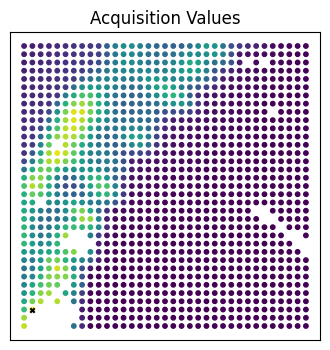

41/50


100%|██████████| 200/200 [00:01<00:00, 114.82it/s, init loss: 20169.8444, avg. loss [191-200]: 19068.7832]



Inferred GP kernel parameters
k_length         [0.375  0.3359]
k_scale          0.3148
noise            0.1764


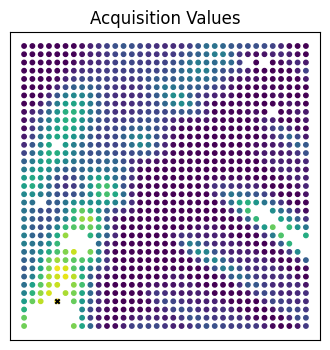

42/50


100%|██████████| 200/200 [00:01<00:00, 112.95it/s, init loss: 20170.9621, avg. loss [191-200]: 19069.5582]



Inferred GP kernel parameters
k_length         [0.3761 0.3563]
k_scale          0.3052
noise            0.17830000000000001


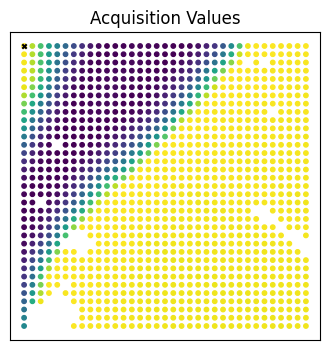

43/50


100%|██████████| 200/200 [00:01<00:00, 114.92it/s, init loss: 20172.1914, avg. loss [191-200]: 19069.3532]



Inferred GP kernel parameters
k_length         [0.3722 0.3456]
k_scale          0.31370000000000003
noise            0.1769


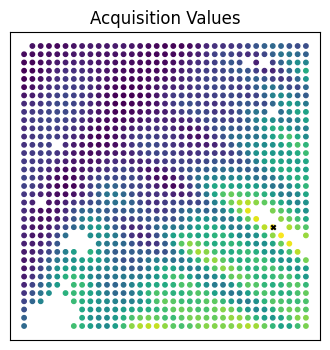

44/50


100%|██████████| 200/200 [00:01<00:00, 116.50it/s, init loss: 20173.3231, avg. loss [191-200]: 19069.6930]



Inferred GP kernel parameters
k_length         [0.3716 0.3651]
k_scale          0.3079
noise            0.1794


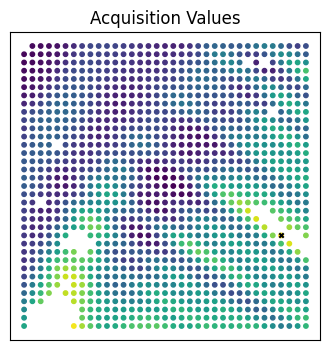

45/50


100%|██████████| 200/200 [00:01<00:00, 115.05it/s, init loss: 20174.5149, avg. loss [191-200]: 19069.5500]



Inferred GP kernel parameters
k_length         [0.3761 0.3406]
k_scale          0.31370000000000003
noise            0.17700000000000002


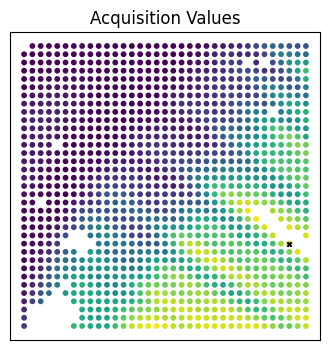

46/50


100%|██████████| 200/200 [00:01<00:00, 115.50it/s, init loss: 20175.6651, avg. loss [191-200]: 19069.9959]



Inferred GP kernel parameters
k_length         [0.375  0.3423]
k_scale          0.3123
noise            0.17800000000000002


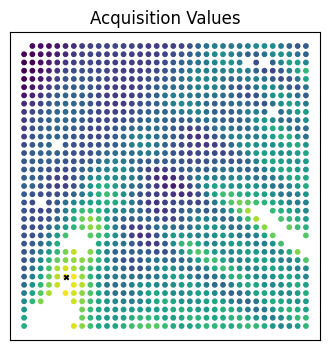

47/50


100%|██████████| 200/200 [00:01<00:00, 112.96it/s, init loss: 20176.8275, avg. loss [191-200]: 19070.4315]



Inferred GP kernel parameters
k_length         [0.3745 0.3531]
k_scale          0.312
noise            0.17750000000000002


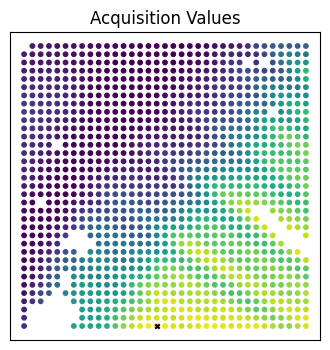

48/50


100%|██████████| 200/200 [00:01<00:00, 113.14it/s, init loss: 20177.9524, avg. loss [191-200]: 19069.5668]



Inferred GP kernel parameters
k_length         [0.378  0.3325]
k_scale          0.31720000000000004
noise            0.17550000000000002


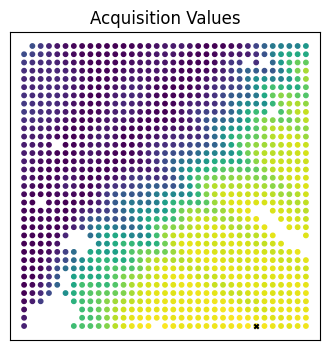

49/50


100%|██████████| 200/200 [00:01<00:00, 111.34it/s, init loss: 20179.1736, avg. loss [191-200]: 19069.3577]



Inferred GP kernel parameters
k_length         [0.372  0.3286]
k_scale          0.3231
noise            0.1744


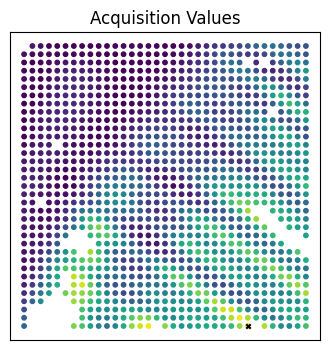

50/50


100%|██████████| 200/200 [00:01<00:00, 111.33it/s, init loss: 20180.3354, avg. loss [191-200]: 19069.9192]



Inferred GP kernel parameters
k_length         [0.3711 0.3505]
k_scale          0.321
noise            0.1744


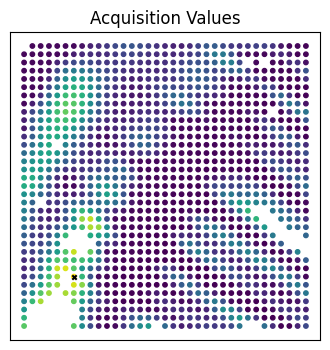

In [ ]:
exploration_steps = 50  # iterations we want to explore

key1, key2 = gpax.utils.get_keys()
for e in range(exploration_steps):
    print("{}/{}".format(e+1, exploration_steps))

    ##########----Start-DKL training, predition, and sampling-----##########
    dkl = gpax.viDKL(data_dim, 2)
    dkl.fit(key1, measured_struc, norm_(measured_spec_scalar), num_steps=200, step_size=0.01)
    obj = gpax.acquisition.EI(key2, dkl, unmeasured_struc)
    # Select next point to "measure"
    next_point_idx = obj.argmax()
    # Plot sampling result
    plot_result(indices_unmeasured, obj)
    ##########-----End-DKL training, predition, and sampling-----##########

#############*********************************************************************************###############
#############******************************************Start**********************************###############
#############***In real experiments, this part will be replaced by spepctroscopy acquistion***###############
    # Do "measurement"
    measuring_spec = spectra[indices_unmeasured[next_point_idx, 1], indices_unmeasured[next_point_idx, 0]]
    measuring_spec_scalar = loop_area(measuring_spec, 8)
#############***************************************************************************###############
#############***************************************************************************###############

    # Update measured/unmeasured data
    measured_struc = np.append(measured_struc, unmeasured_struc[next_point_idx][None], 0)
    unmeasured_struc = np.delete(unmeasured_struc, next_point_idx, 0)
    measured_spec_scalar = np.append(measured_spec_scalar, measuring_spec_scalar)
    indices_measured = np.append(indices_measured, indices_unmeasured[next_point_idx][None], 0)
    indices_unmeasured = np.delete(indices_unmeasured, next_point_idx, 0)

Plot DKL sampled points and corresponding physical property

([], [])

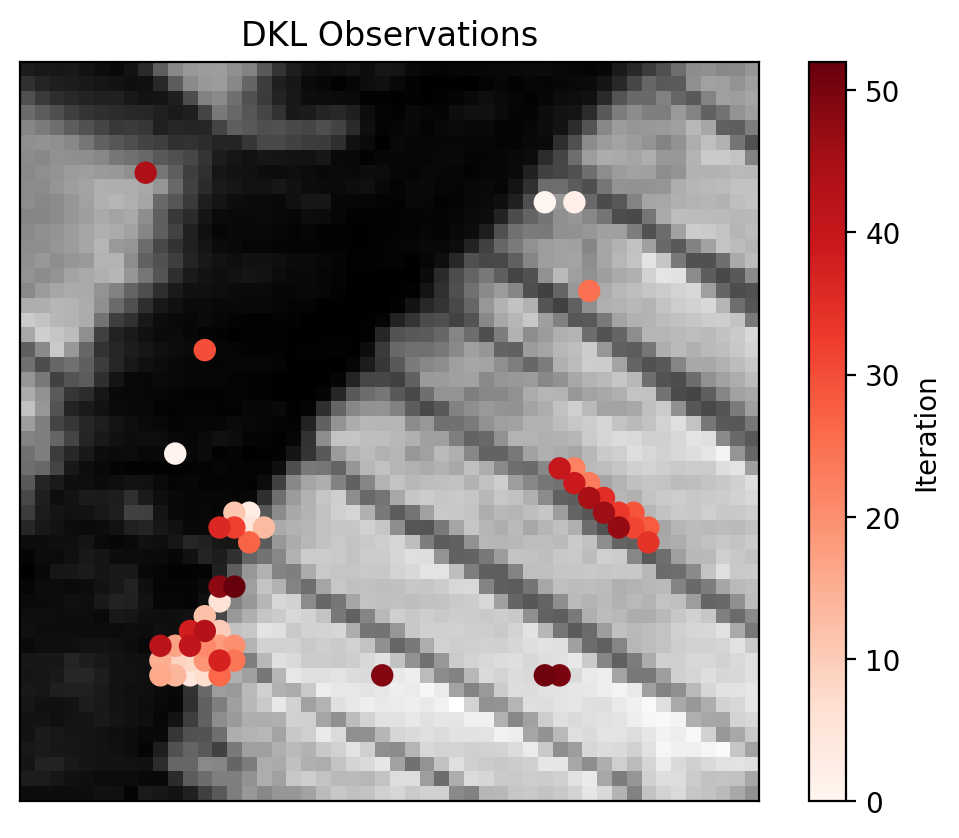

In [ ]:
plt.figure(dpi = 200)
plt.imshow(image, origin="lower", cmap='gray')
plt.scatter(indices_measured[:, 1], indices_measured[:, 0],
            c=np.arange(len(indices_measured)), s=50, cmap="Reds")
plt.colorbar(label="Iteration")
plt.title("DKL Observations")
plt.xticks([])
plt.yticks([])

Trained DKL can make prediction over the entire space

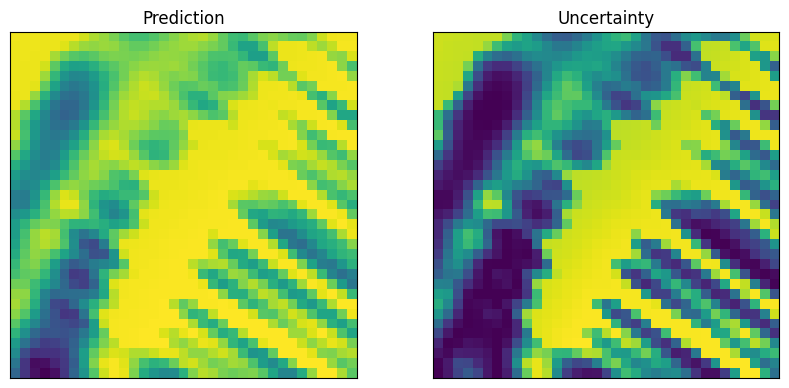

In [ ]:
mean, var = dkl.predict(key2, struc_imgs)

fig, (ax1, ax2) = plt.subplots(1, 2, figsize=(10, 4.5), dpi=100)
ax1.imshow(mean.reshape((35,35)), origin = 'lower')
ax1.set_title("Prediction")
ax2.imshow(var.reshape((35,35)), origin = 'lower')
ax2.set_title("Uncertainty")
for _ax in fig.axes:
    _ax.set_aspect('equal')
    _ax.set_xticks([])
    _ax.set_yticks([])